## NN para clasificación de pájaras en función del canto

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import IPython.display as ipd
import librosa
from scipy.signal import periodogram
import os
import soundfile as sf
from scipy.io import wavfile
import random

#### Recortar y generar varios samples de cada sonido de pájaro

In [107]:
def print_plot_play(x, Fs, text=''):
    """1. Prints information about an audio singal, 2. plots the waveform, and 3. Creates player
    
    Notebook: C1/B_PythonAudio.ipynb
    
    Args: 
        x: Input signal
        Fs: Sampling rate of x    
        text: Text to print
    """
    print('%s Fs = %d, x.shape = %s, x.dtype = %s' % (text, Fs, x.shape, x.dtype))
    plt.figure(figsize=(8, 2))
    plt.plot(x, color='gray')
    plt.xlim([0, x.shape[0]])
    plt.xlabel('Time (samples)')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()
    ipd.display(ipd.Audio(data=x, rate=Fs))


MP3 file:  Fs = 48000, x.shape = (4145400,), x.dtype = float32


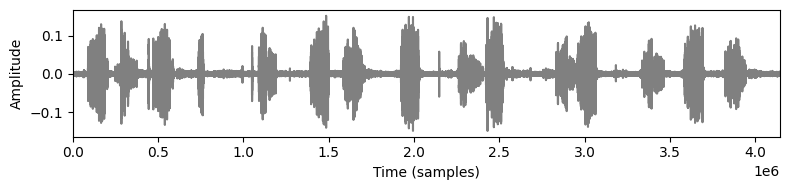

In [108]:
# Read mp3
fn_mp3 = './data/birds audio/aberts towhee/call.mpeg'
x, Fs = librosa.load(fn_mp3, sr=None)
print_plot_play(x=x, Fs=Fs, text='MP3 file: ')

Frecuencia de muestreo mpeg
* 0: 96000 Hz
* 1: 88200 Hz
* 2: 64000 Hz
* 3: 48000 Hz
* 4: 44100 Hz
* 5: 32000 Hz
* 6: 24000 Hz
* 7: 22050 Hz
* 8: 16000 Hz
* 9: 12000 Hz
* 10: 11025 Hz
* 11: 8000 Hz
* 12: 7350 Hz

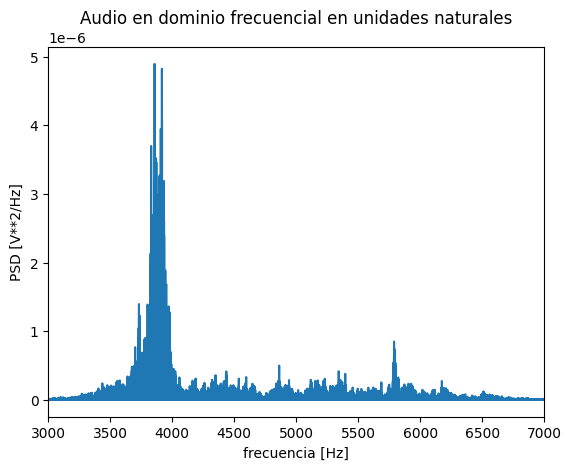

In [209]:
f, Pxx_den = periodogram(x, Fs)
#Pxx_den_db = 10*np.log10(Pxx_den)
plt.plot(f, Pxx_den)
plt.xlim([3e3, 7e3])
#plt.ylim([-150, -30])
plt.xlabel('frecuencia [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.title('Audio en dominio frecuencial en unidades naturales')
plt.show()

C:\Users\magonzalezm\AppData\Local\Temp\ipykernel_23720\4079542448.py:2: RuntimeWarning: divide by zero encountered in log10
  Pxx_den_db = 10*np.log10(Pxx_den)


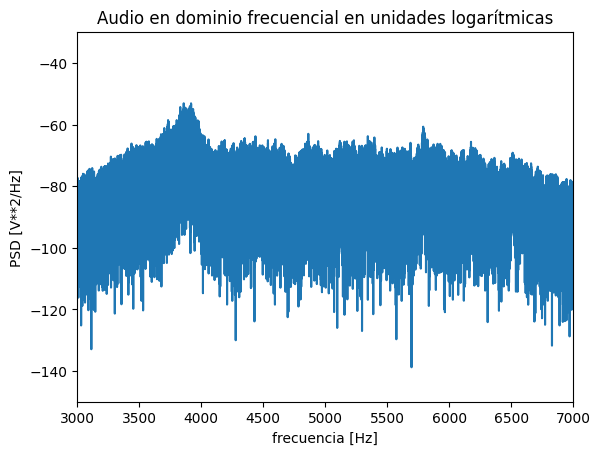

In [211]:
f, Pxx_den = periodogram(x, Fs)
Pxx_den_db = 10*np.log10(Pxx_den)
plt.plot(f, Pxx_den_db)
plt.xlim([3e3, 7e3])
plt.ylim([-150, -30])
plt.xlabel('frecuencia [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.title('Audio en dominio frecuencial en unidades logarítmicas')
plt.show()

HAy audios con SNR baja, lo que ocasionará problemas de identificación

In [2]:
def cut_and_save_audios(): 
    src_path = './data/birds audio/'
    audio_list = os.listdir(src_path)
    audio_path = ''
    freqs = []
    for folder in audio_list:
        for f in os.listdir(src_path + folder):
            if f.endswith('.mpeg') and (not f[0].isnumeric()):
                audio_path = folder + '/' + f
                try:
                    audio, fs = librosa.load(src_path + audio_path, sr=44100)
                    freqs.append(fs)
                    audio_seconds = audio.shape[0] / fs
                    if audio_seconds > 10:
                        for i in range(5):              
                            ten_secs = int(10*fs)
                            limite_inicio = audio.shape[0] - ten_secs
                            inicio = np.random.randint(limite_inicio)
                            fin = inicio + ten_secs
                            wavfile.write(
                                src_path + folder + f'/{i+1}_cut.wav', 
                                fs, 
                                audio[inicio:fin])
                except Exception as e:
                    print(f'Unexpected exception rose while {folder} was being transformed, {e}')
                    pass
        # print_plot_play(audio, fs)

In [3]:
cut_and_save_audios()

C:\Users\magonzalezm\AppData\Local\Temp\ipykernel_23720\437331133.py:11: UserWarning: PySoundFile failed. Trying audioread instead.
  audio, fs = librosa.load(src_path + audio_path, sr=44100)
c:\Users\magonzalezm\OneDrive - GRUPO INTERMARK 96 SL\Escritorio\Cursos\Marina B - Curso python\birdsDL\.venv\lib\site-packages\librosa\core\audio.py:183: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Unexpected exception rose while harriss hawk was being transformed, 
Unexpected exception rose while rufous crowned sparrow was being transformed, [Errno 13] Permission denied: './data/birds audio/rufous crowned sparrow/5_cut.wav'


In [181]:
import tensorflow as tf

#### Generación del conjunto de train y test

In [182]:
def train_test_data(n_birds_sample=20): # escoge 300 pájaros aleatorios para que no de fallo de memoria
    src_path = './data/birds audio/'
    audio_reader = os.listdir(src_path)
    birds = random.sample(audio_reader, n_birds_sample)
    audio_path = ''
    X = []
    Y = []
    for bird in birds:
        for f in os.listdir(src_path + bird):
            if f.endswith('.wav') and (f[0].isnumeric()):
                audio_path = bird + '/' + f
                audio, fs = librosa.load(src_path + audio_path, sr=44100)
                bool_arr = np.array(birds) == bird
                zetas = np.zeros(len(birds))
                zetas[bool_arr] = 1
                spect = librosa.feature.melspectrogram(y=audio, sr=44100)
                spect = spect[..., tf.newaxis]

                zetas = list(zetas)

                
                X.append(spect)
                Y.append(zetas)

    X = np.array(X)
    Y = np.array(Y)
    dropped_pos = 5
    X_test = X[(dropped_pos-1)::dropped_pos, :]
    X_train = np.delete(X, np.arange(dropped_pos-1, X.shape[0], dropped_pos), axis=0)
    y_test = Y[(dropped_pos-1)::dropped_pos, :]
    y_train = np.delete(Y, np.arange(dropped_pos-1, Y.shape[0], dropped_pos), axis=0)

    return (X_train, y_train), (X_test, y_test)

In [197]:
n_pajaros = 150
(X_train, y_train), (X_test, y_test) = train_test_data(n_pajaros)

#### Creación del modelo y entrenamiento

In [198]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.Input(shape=X_train.shape[1:]))
model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(64, activation='relu'))
model.add(tf.keras.layers.Dense(10, activation='relu'))
model.add(tf.keras.layers.Dense(10, activation='relu'))
model.add(tf.keras.layers.Dense(n_pajaros, activation='softmax'))
model.summary()

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 126, 860, 32)      320       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 63, 430, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 61, 428, 64)       18496     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 30, 214, 64)       0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 410880)            0         
                                                                 
 dense_78 (Dense)            (None, 64)              

In [203]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0075)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [204]:
model.fit(X_train, y_train, epochs=30)

Epoch 1/30
19/19 [==============================] - 22s 1s/step - loss: 1.9925 - accuracy: 0.4392
Epoch 2/30
19/19 [==============================] - 22s 1s/step - loss: 1.9909 - accuracy: 0.4949
Epoch 3/30
19/19 [==============================] - 23s 1s/step - loss: 1.7839 - accuracy: 0.5507
Epoch 4/30
19/19 [==============================] - 24s 1s/step - loss: 1.5641 - accuracy: 0.5608
Epoch 5/30
19/19 [==============================] - 25s 1s/step - loss: 1.4632 - accuracy: 0.5760
Epoch 6/30
19/19 [==============================] - 28s 1s/step - loss: 1.6032 - accuracy: 0.5912
Epoch 7/30
19/19 [==============================] - 33s 2s/step - loss: 1.3992 - accuracy: 0.5777
Epoch 8/30
19/19 [==============================] - 45s 2s/step - loss: 1.3683 - accuracy: 0.6115
Epoch 9/30
19/19 [==============================] - 31s 2s/step - loss: 1.2555 - accuracy: 0.6182
Epoch 10/30
19/19 [==============================] - 24s 1s/step - loss: 1.1998 - accuracy: 0.6470
Epoch 11/30
19/19 [

#### Evaluación

In [207]:
test_loss, test_acc = model.evaluate(X_test, y_test)

5/5 [==============================] - 1s 180ms/step - loss: 16.0513 - accuracy: 0.1216


In [206]:
predictions = model.predict(X_test)

5/5 [==============================] - 2s 350ms/step
